<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Adiabatic-evolution,-for-reference" data-toc-modified-id="Adiabatic-evolution,-for-reference-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Adiabatic evolution, for reference</a></span></li><li><span><a href="#Old-bangramp-calculations" data-toc-modified-id="Old-bangramp-calculations-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Old bangramp calculations</a></span></li><li><span><a href="#Optimizations-(Rabi-and-LMG)-20190217" data-toc-modified-id="Optimizations-(Rabi-and-LMG)-20190217-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Optimizations (Rabi and LMG) 20190217</a></span></li><li><span><a href="#Optimizations-(Rabi-and-LMG)-20190227" data-toc-modified-id="Optimizations-(Rabi-and-LMG)-20190227-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Optimizations (Rabi and LMG) 20190227</a></span></li><li><span><a href="#Optimizations-(Rabi-and-LMG)-20190228" data-toc-modified-id="Optimizations-(Rabi-and-LMG)-20190228-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Optimizations (Rabi and LMG) 20190228</a></span><ul class="toc-item"><li><span><a href="#What-happens-for-different-boundaries?" data-toc-modified-id="What-happens-for-different-boundaries?-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>What happens for different boundaries?</a></span></li><li><span><a href="#And-changing-the-number-of-spins-in-the-LMG?" data-toc-modified-id="And-changing-the-number-of-spins-in-the-LMG?-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>And changing the number of spins in the LMG?</a></span></li></ul></li><li><span><a href="#LMG:-critical-point-crossing" data-toc-modified-id="LMG:-critical-point-crossing-6"><span class="toc-item-num">6&nbsp;&nbsp;</span><strong>LMG</strong>: critical point crossing</a></span><ul class="toc-item"><li><span><a href="#$50$-spins" data-toc-modified-id="$50$-spins-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>$50$ spins</a></span></li><li><span><a href="#$20$-spins" data-toc-modified-id="$20$-spins-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>$20$ spins</a></span></li><li><span><a href="#Using-as-target-$g=1.5$-instead-of-$g=2$" data-toc-modified-id="Using-as-target-$g=1.5$-instead-of-$g=2$-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Using as target $g=1.5$ instead of $g=2$</a></span></li></ul></li><li><span><a href="#Rabi:-critical-point-crossing" data-toc-modified-id="Rabi:-critical-point-crossing-7"><span class="toc-item-num">7&nbsp;&nbsp;</span><strong>Rabi</strong>: critical point crossing</a></span></li><li><span><a href="#Optimisations-(Rabi-and-LMG)-with-triplebang" data-toc-modified-id="Optimisations-(Rabi-and-LMG)-with-triplebang-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Optimisations (Rabi and LMG) with triplebang</a></span></li><li><span><a href="#LMG:-doublebang-scans" data-toc-modified-id="LMG:-doublebang-scans-9"><span class="toc-item-num">9&nbsp;&nbsp;</span><strong>LMG</strong>: doublebang scans</a></span></li><li><span><a href="#LMG:-doublebang,-optimal-time-VS-number-of-spins" data-toc-modified-id="LMG:-doublebang,-optimal-time-VS-number-of-spins-10"><span class="toc-item-num">10&nbsp;&nbsp;</span><strong>LMG</strong>: doublebang, optimal time VS number of spins</a></span><ul class="toc-item"><li><span><a href="#Can-we-get-arbitrarily-low-infidelities-with-just-$4$-spins-in-the-LMG??-(spoilers:-no)" data-toc-modified-id="Can-we-get-arbitrarily-low-infidelities-with-just-$4$-spins-in-the-LMG??-(spoilers:-no)-10.1"><span class="toc-item-num">10.1&nbsp;&nbsp;</span>Can we get arbitrarily low infidelities with just $4$ spins in the LMG?? (spoilers: no)</a></span></li></ul></li><li><span><a href="#Landau-Zener-tests" data-toc-modified-id="Landau-Zener-tests-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Landau-Zener tests</a></span></li></ul></div>

In [1]:
import datetime
import logging
import os
import pickle
import sys
import time
import functools

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly.express
import plotly.io
plotly.io.templates.default = "plotly_white"
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()
import progressbar
import qutip
#QuTiP control modules
import qutip.control.pulseoptim as cpo
import qutip.logging_utils
import scipy
import seaborn as sns

if './src/' not in sys.path:
    sys.path.append('./src/')
import rabi_model
import lmg_model
import lz_model
import optimization
import protocol_ansatz
import hamiltonians
from utils import ground_state

sns.set()

%load_ext autoreload
%autoreload 2
%matplotlib inline

# Adiabatic evolution, for reference

Test with adiabatic evolution. Plot of fidelity between final state and critical gs for various times. It is evident that good fidelities require very long times.

100% (40 of 40) |########################| Elapsed Time: 0:00:20 Time:  0:00:20


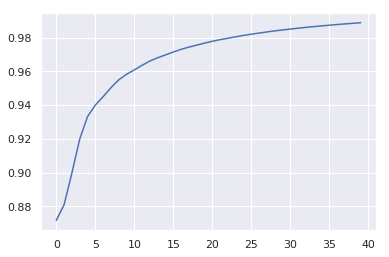

In [143]:
# set where to truncate Fock state
N = 100
# set constant coefficients
Omega = N
omega_0 = 1.
lambda_c = np.sqrt(Omega * omega_0) / 2. # critical coefficient
# initial and target hamiltonians
initial_hamiltonian = rabi_model.QRM_free_term(N, Omega, omega_0)
final_hamiltonian = rabi_model.QRM_full(N, Omega, omega_0, lambda_c)
# times and settings
times_to_try = np.arange(0, 40)
target_state = ground_state(final_hamiltonian)
results = []
bar = progressbar.ProgressBar()
for tf in bar(times_to_try):
    final_state = optimization.evolve_adiabatically(initial_hamiltonian, final_hamiltonian, tf)
    results.append(qutip.fidelity(final_state, target_state))

plt.figure()
plt.plot(times_to_try, results)

# Old bangramp calculations

See what happens when the second ramp is removed. The protocol thus becomes two constant ramps, and the parameters to optimize are their heights and the the time at which the first becomes the second one.

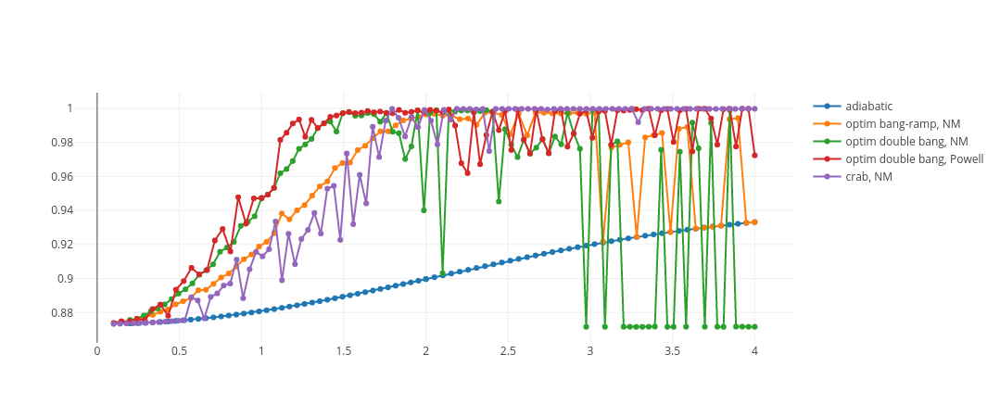

In [220]:
def _():
    # load data
    bangrampAndAdiabatic_df = pd.read_csv('rabi_Omega100_bangrampOptimizedWithNelderMead+adiabatic.csv', index_col=0)
    bangrampNoRamp_df = pd.read_csv('rabi_Omega100_bangrampWithoutRampOptimizedWithNelderMead.csv', index_col=0)
    bangrampNoRampPowell_df = pd.read_csv('rabi_Omega100_bangrampWithoutRampOptimizedWithPowell.csv', index_col=0)
    crab_df = pd.read_csv('rabi_Omega100_crab_2frequencies.csv', index_col=0)
    # plot
    traces = [
        go.Scatter(
            x=bangrampAndAdiabatic_df['tf'], y=bangrampAndAdiabatic_df['adiabatic_fid'],
            mode='lines+markers', name='adiabatic'
        ),
        go.Scatter(
            x=bangrampAndAdiabatic_df['tf'], y=bangrampAndAdiabatic_df['fid'],
            mode='lines+markers', name='optim bang-ramp, NM'
        ),
        go.Scatter(
            x=bangrampNoRamp_df['tf'], y=bangrampNoRamp_df['fid'],
            mode='lines+markers', name='optim double bang, NM'
        ),
        go.Scatter(
            x=bangrampNoRampPowell_df['tf'], y=bangrampNoRampPowell_df['fid'],
            mode='lines+markers', name='optim double bang, Powell'
        ),
        go.Scatter(
            x=crab_df['tf'], y=crab_df['fid'],
            mode='lines+markers', name='crab, NM'
        )
    ]
    plotly.offline.iplot(traces)
_()

# Optimizations (Rabi and LMG) 20190217

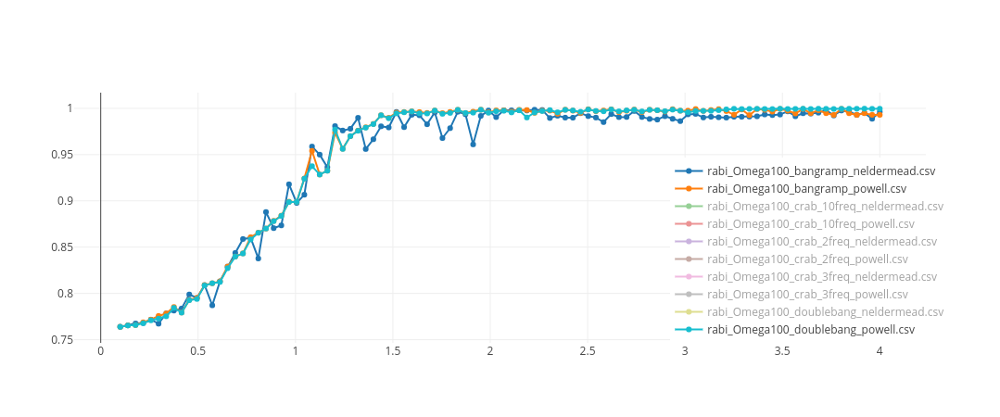

In [9]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_20190217/rabi*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='lines+markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

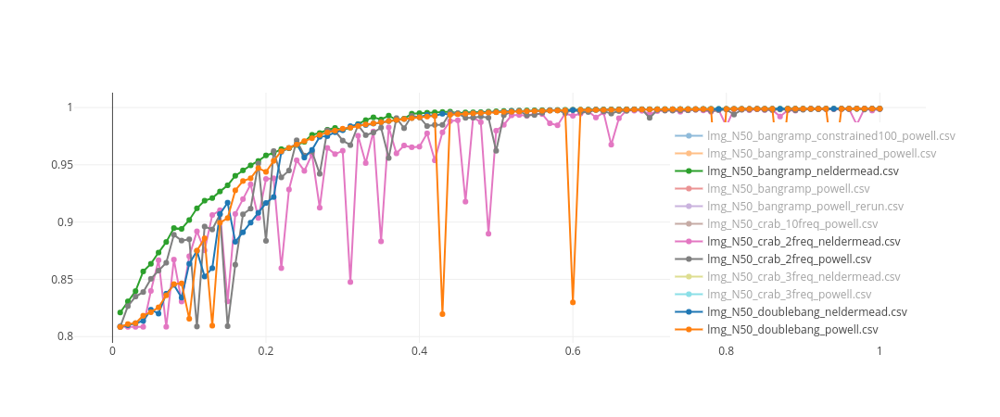

In [10]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_20190217/lmg*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='lines+markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

In [320]:
# 3.015152	0.995751	4.396702
N = 100
Omega = 100
omega_0 = 1
lambda_c = np.sqrt(Omega * omega_0) / 2.
# build Hamiltonians
H0 = rabi_model.QRM_free_term(N, Omega, omega_0)
H1 = rabi_model.QRM_interaction_term(N)
# compute initial and target states
target_state = ground_state(H0 + lambda_c * H1)
# let's try here using random initial parameters
final_state = optimization.evolve_state(
    hamiltonian=H0 + 4.3967 * H1,
    initial_state=ground_state(H0),
    time=3.015
)
qutip.fidelity(target_state, final_state)

0.9978505230547141

In [475]:
pickles = glob.glob('./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/failed_optimizations/*')
print(pickles[1])
with open(pickles[1], 'rb') as fp:
    data = pickle.load(fp)
data['protocol'].__dict__

./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/failed_optimizations/porcodio(00).pickle


{'num_frequencies': 2,
 'name': 'crab',
 'pars_names': ['A1', 'A2', 'B1', 'B2'],
 'hyperpars': {'y0': 0,
  'y1': 2,
  'tf': 0.5,
  'nuk': array([-0.24078063, -0.31520007])},
 'pars_constraints': [[-200, 200], [-200, 200], [-200, 200], [-200, 200]],
 'total_height_constraint': [-4, 4],
 'out_of_boundaries': False,
 'generate_rnd_frequencies_each_tf': True}

In [488]:
qutip.fidelity(
    ground_state(lmg_model.LMG_full_hamiltonian(num_spins=50, g_value=0)),
    ground_state(lmg_model.LMG_full_hamiltonian(num_spins=50, g_value=1.5))
)**2

0.00283939037472451

In [485]:
optimization.optimize_model_parameters(
    hamiltonians=data['hamiltonian'],
    initial_state=data['initial_state'],
    target_state=data['target_state'],
    evolution_time=data['evolution_time'],
    protocol=data['protocol'],
    initial_parameters=data['initial_parameters']
)

INFO:root:Starting optimization for tf=0.5
DEBUG:root:Optimization method: Nelder-Mead
DEBUG:root:Optimization options: None
INFO:root:Initial parameter values: [0.2579919906169965, -0.19468479101788905, 0.6314762794641866, 0.48782739039866985]
INFO:root:Final fidelity: 1.4621978093794264e-05
INFO:root:Final parameters: [-25.08819356  34.61517747 -57.52586874 199.99999774]


          data: {'initial_pars': [0.2579919906169965, -0.19468479101788905, 0.6314762794641866, 0.48782739039866985]}
 final_simplex: (array([[-25.08819356,  34.61517747, -57.52586874, 199.99999774],
       [-25.0882017 ,  34.61517694, -57.52583577, 199.99999877],
       [-25.08821062,  34.61517658, -57.52579657, 199.99999791],
       [-25.08817636,  34.61517795, -57.52594322, 199.99999815],
       [-25.08817982,  34.61517688, -57.52593134, 199.99999869]]), array([0.99617613, 0.99617613, 0.99617613, 0.99617613, 0.99617613]))
           fun: 0.996176130481594
       message: 'Optimization terminated successfully.'
          nfev: 456
           nit: 250
        status: 0
       success: True
             x: array([-25.08819356,  34.61517747, -57.52586874, 199.99999774])

# Optimizations (Rabi and LMG) 20190227

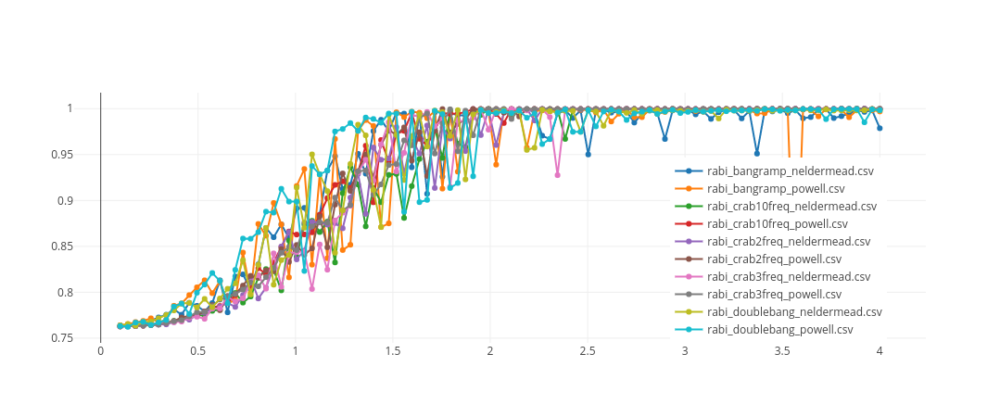

In [15]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_20190227/rabi*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='lines+markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

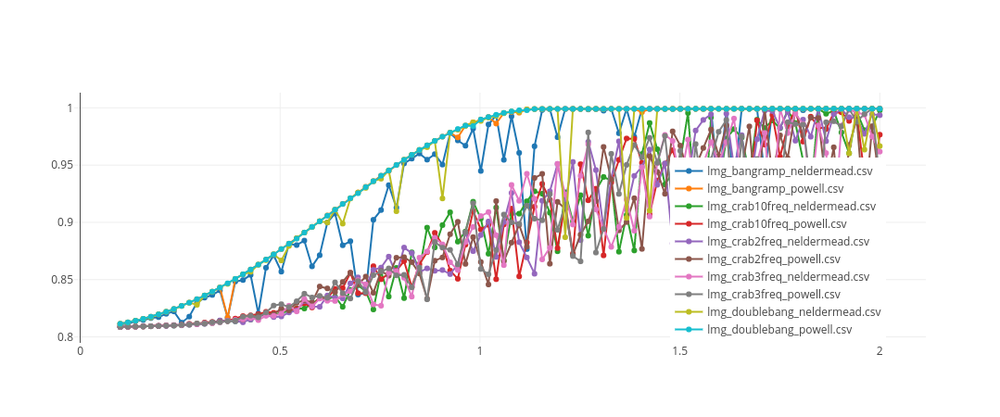

In [16]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_20190227/lmg*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='lines+markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

Trying to solve letting qutip know it's two constant evolutions

# Optimizations (Rabi and LMG) 20190228

Optimization results for the Rabi model. Here, the total dimension of the Fock space is fixed to $N=100$, as well as the other parameters are fixed to $\Omega=100$ and $\omega_0=1$. For many different total times $t_f$ we optimize the fidelity with which the ground state of the noninteracting Hamiltonian is evolved into the ground state of the Hamiltonian at the critical point (given by $\lambda_c=\sqrt{\Omega\omega_0}/2=5$).

Notably, the parameters are constrained to double the critical point: $2\lambda_c=10$.
Interestingly, this does not seem to affect the optimal solutions, the fidelity of which are comparable with those found when in the optimization there was no constraint over the parameter.

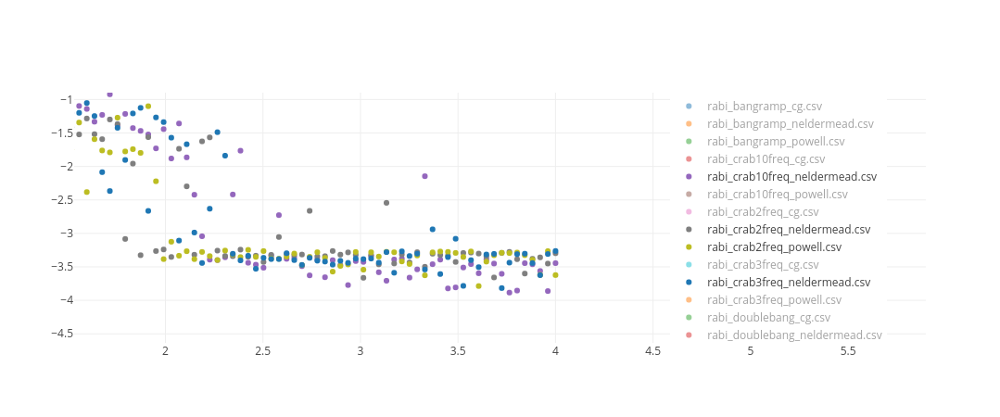

In [59]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_20190228/rabi*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(1 - df['fid']),
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

In [10]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_20190228/lmg*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(1 - df['fid']),
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

Make plot of LMG best optimisations for paper

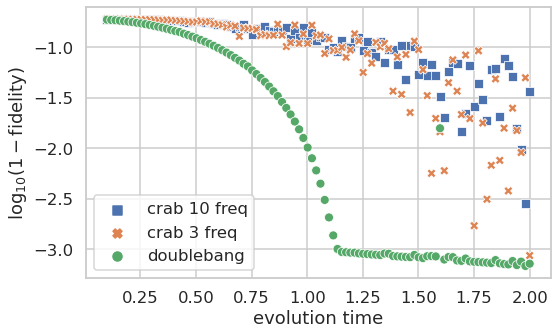

In [165]:
def _():
    sns.set_style('whitegrid')
    sns.set_context("talk")
    # load data
    datafiles = ['./results/rabi_and_lmg_optimizations_20190228/lmg_crab10freq_neldermead.csv',
                 './results/rabi_and_lmg_optimizations_20190228/lmg_crab3freq_neldermead.csv',
                 './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv']
    names = ['crab 10 freq', 'crab 3 freq', 'doublebang']
    tmp_list = []
    for datafile, name in zip(datafiles, names):
        df = pd.read_csv(datafile, index_col=0)[['tf', 'fid']]
        df['source'] = name
        tmp_list.append(df)
    df = pd.concat(tmp_list, axis=0, ignore_index=True)
    df['fid'] = np.log10(1 - df['fid'])
    # create plot
    fig, ax = plt.subplots(1, 1, figsize=(5 * scipy.constants.golden, 5))
    markers = {'crab 10 freq': 's', 'crab 3 freq': 'X', 'doublebang': 'o'}
    sns.scatterplot(data=df, x='tf', y='fid', hue='source', style='source',
                    markers=markers, ax=ax)
    ax.set(xlabel='evolution time', ylabel=r'$\log_{10}(1-\operatorname{fidelity})$')
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    plt.tight_layout()
    fig.savefig('lmg_50spin_toCriticalPoint_crabAndDB.pdf')
_()

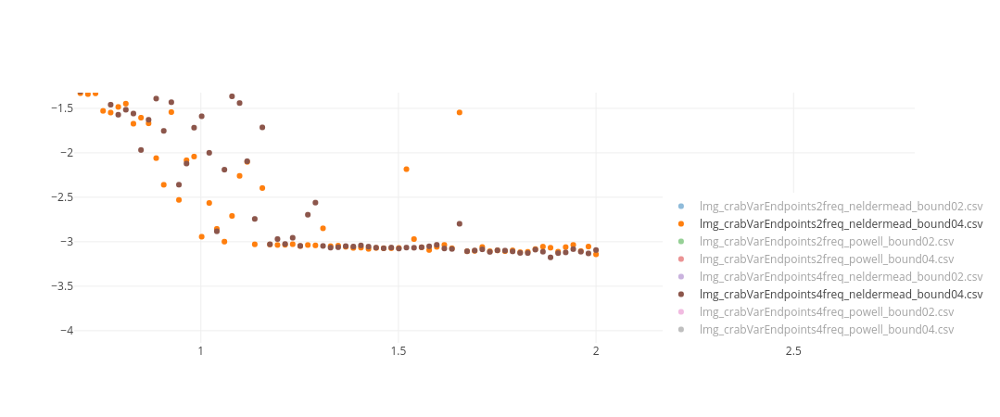

In [60]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crab_variableendpoints_20190919/lmg*csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(1 - df['fid']),
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

Looking at the behaviour of total evolution time vs fidelity obtained via optimization, we find a behaviour of the form $\mathcal I\sim \cos(\pi t_f/2)^2$

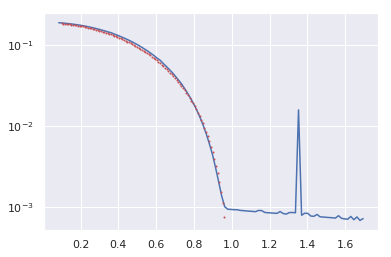

In [492]:
# load data
datafile = './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv'
df = pd.read_csv(datafile, index_col=0)
times = df['tf'] / 1.18
infidelities = 1 - df['fid']
plt.figure();
plt.plot(times, infidelities)
xs = np.linspace(0.1, 0.96, 100)
ys = [0.19 * np.cos(np.pi / 2 * x)**2 for x in xs]
plt.semilogy(xs, ys, 'ro', markersize=1)

In [511]:
datafile = './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv'
df = pd.read_csv(datafile, index_col=0)
data = df.iloc[42]
# df[(df['tf'] > 0.9) & (df['tf'] < 1)]
num_spins = 50
tf = data['tf']
y0 = data['y0']
t1 = data['t1']
y1 = data['y1']
H0 = lmg_model.LMG_free_term(num_spins=num_spins)
H1 = lmg_model.LMG_interaction_term(num_spins=num_spins)

protocol = protocol_ansatz.DoubleBangProtocolAnsatz()
protocol.fill_hyperpar_value(tf=tf)
fun = protocol.time_dependent_fun([y0, t1, y1])
qutip.mesolve(
    H=[H0, [H1, fun]],
    rho0=ground_state(H0),
    tlist=np.linspace(0, tf, 20)
)

DEBUG:root:Initializing ProtocolAnsatz instance "doublebang"
DEBUG:root:Setting hyperparameter tf=0.9060606060606059


Result object with sesolve data.
--------------------------------
states = True
num_collapse = 0

## What happens for different boundaries?

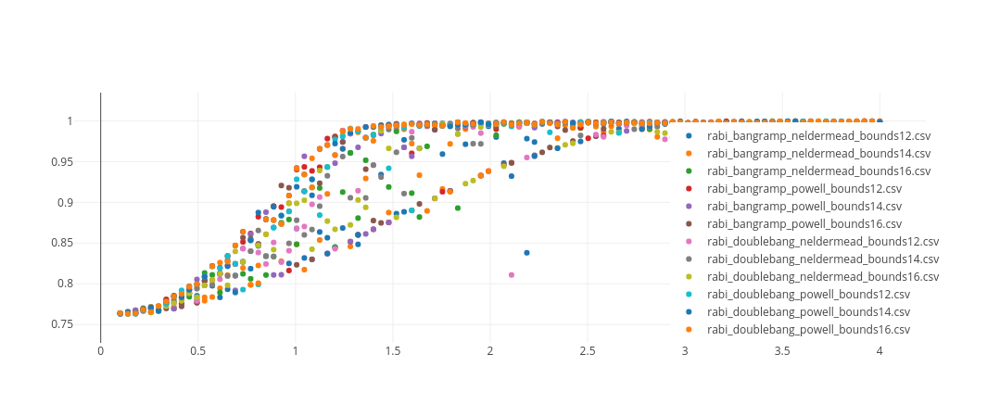

In [617]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_different_constraints_20190228/rabi*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

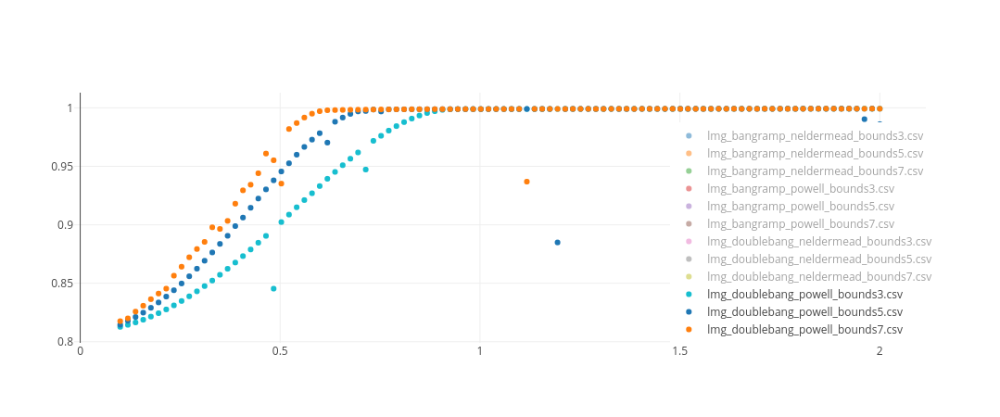

In [580]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_different_constraints_20190228/lmg*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

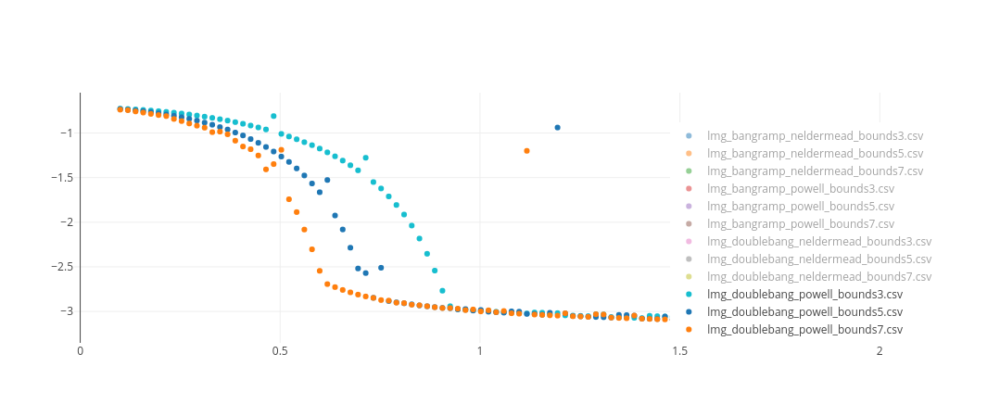

In [57]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_different_constraints_20190228/lmg*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(1 - df['fid']),
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

## And changing the number of spins in the LMG?

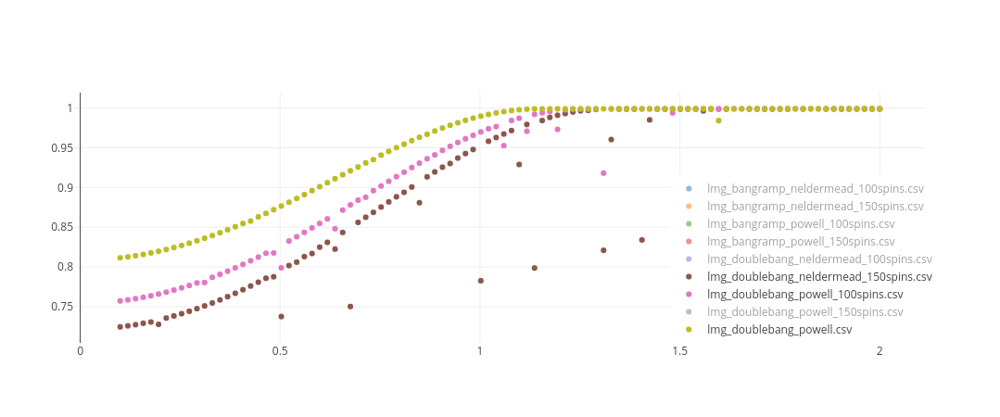

In [216]:
def _():
    # load data
    datafiles = !ls ./results/lmg_different_spinnumbers_20190228/*.csv
    additional_50spins_file = './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv'
    datafiles += [additional_50spins_file]
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

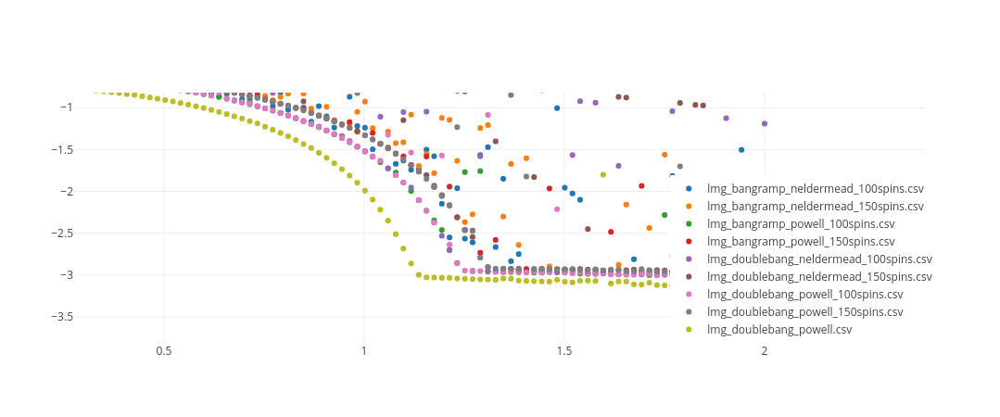

In [61]:
def _():
    # load data
    datafiles = !ls ./results/lmg_different_spinnumbers_20190228/*.csv
    additional_50spins_file = './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv'
    datafiles += [additional_50spins_file]
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(1 - df['fid']),
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

In [45]:
np.exp(-7)

0.0009118819655545162

# **LMG**: critical point crossing

## $50$ spins

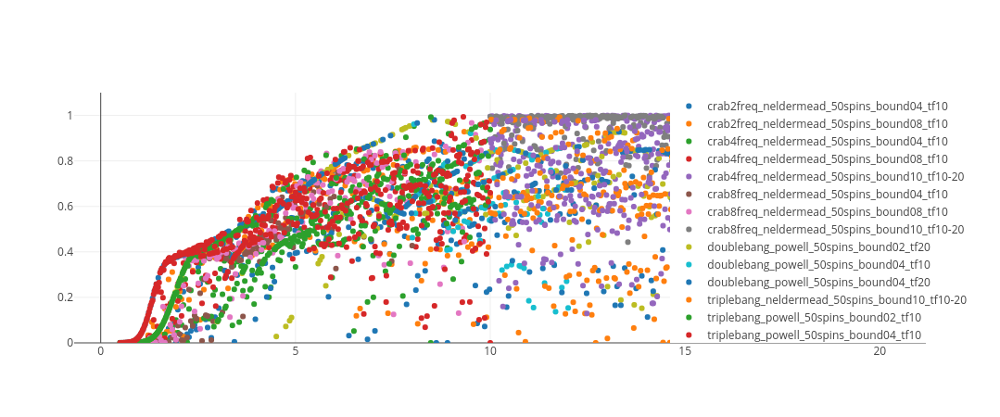

In [306]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/lmg*50spins*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1][4:-4]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0), yaxis=dict(range=[0, 1.1]))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

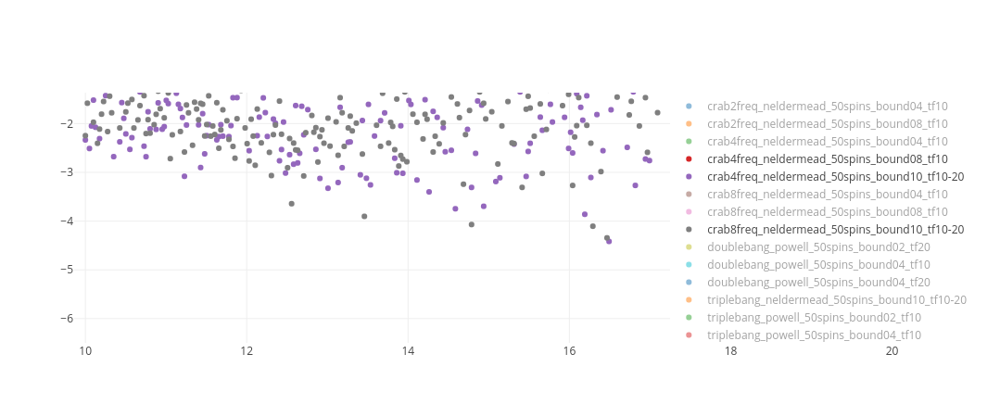

In [67]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/lmg*50spins*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(np.abs(1 - df['fid'])),
            mode='markers', name=os.path.split(file)[-1][4:-4]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

## $20$ spins

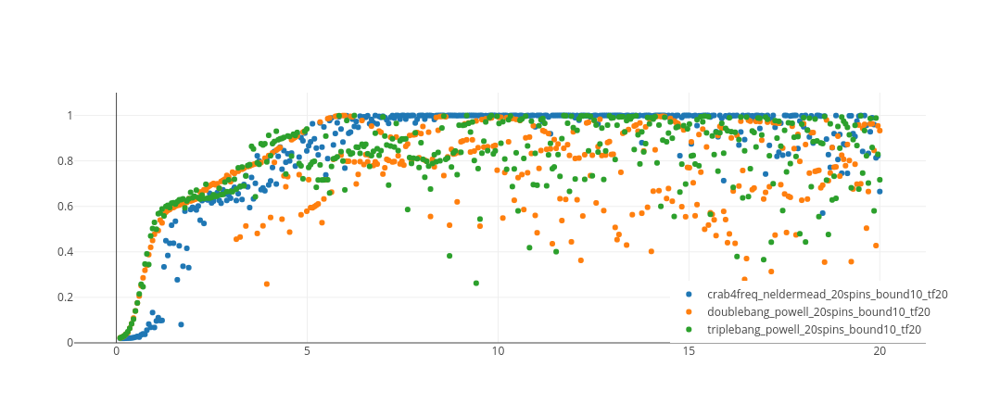

In [210]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/lmg*20spins*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1][4:-4]
        ))
    layout = go.Layout(
        legend=dict(x=.7, y=0),
        yaxis=dict(range=[0, 1.1])
    )
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

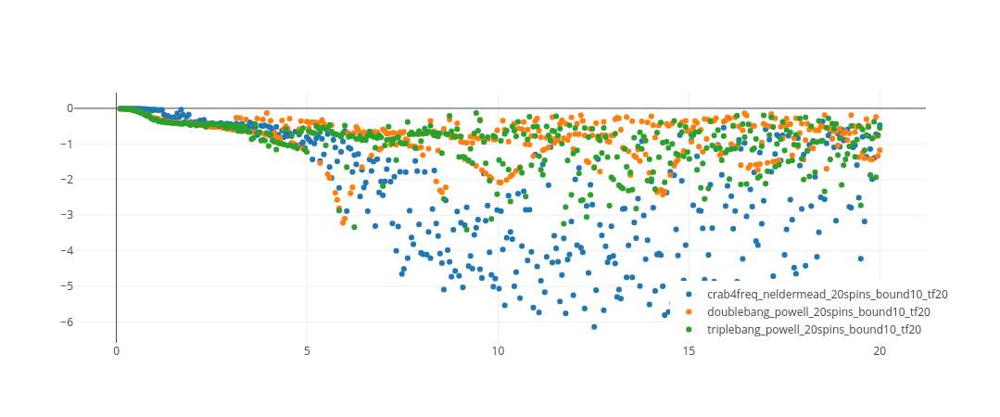

In [66]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/lmg*20spins*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(np.abs(1 - df['fid'])),
            mode='markers', name=os.path.split(file)[-1][4:-4]
        ))
    layout = go.Layout(
        legend=dict(x=.7, y=0)
    )
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

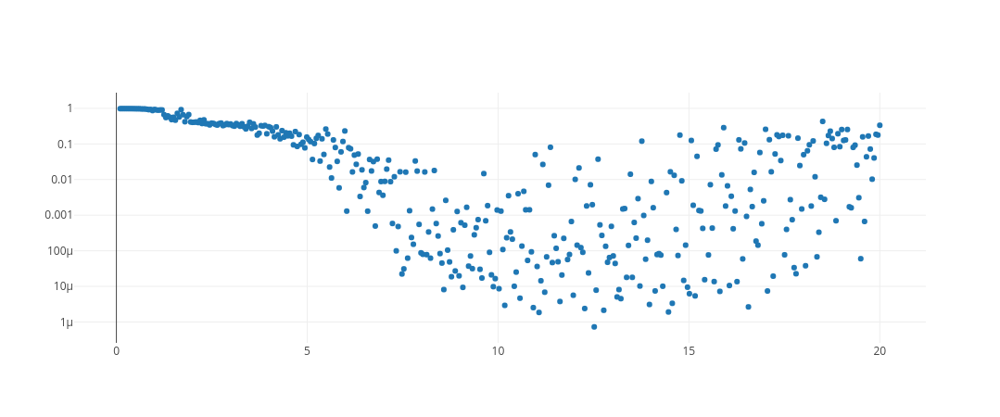

In [201]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/lmg*20spins*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=1 - df['fid'],
            mode='markers', name=os.path.split(file)[-1][4:-4]
        ))
    layout = go.Layout(
        legend=dict(x=.7, y=0),
#         yaxis=dict(range=[0, 1.1])
        yaxis=dict(type='log', autorange=True)
    )
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

In [ ]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/lmg*20spins*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1][4:-4]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0), yaxis=dict(range=[0, 1.1]))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

## Using as target $g=1.5$ instead of $g=2$

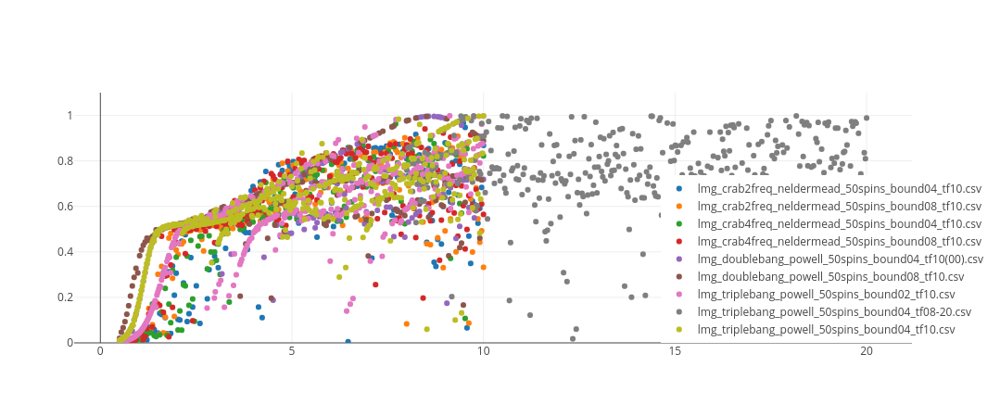

In [195]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/optimizations_targetg1.5/*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0), yaxis=dict(range=[0, 1.1]))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

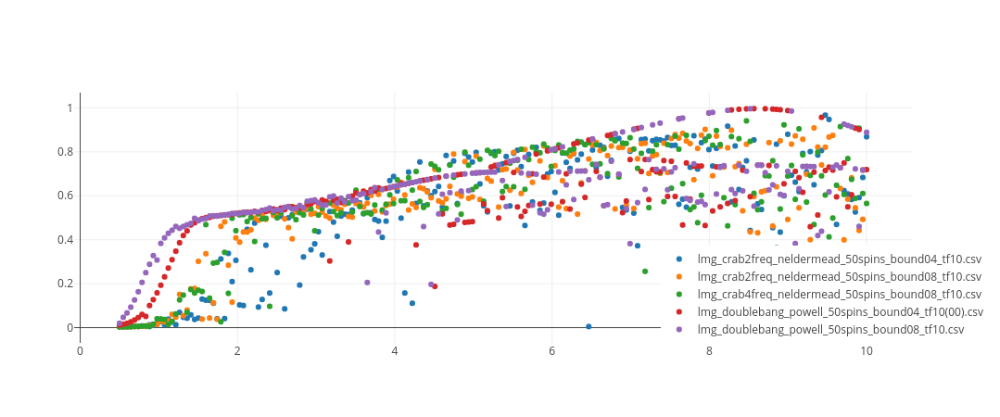

In [490]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/optimizations_targetg1.5/*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

In [383]:
filename = './results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/'
filename += 'lmg_doublebang_powell_50spins_bound02_tf20.csv'
df = pd.read_csv(filename, index_col=0)
df[(df['tf'] >= 8.5) & (df['tf'] <= 8.52)]

,tf,fid,y0,t1,y1
164,8.515038,0.9802,1.102839,5.188506,1.47825


In [436]:
num_spins=50
tf = 8.515
y0 = 0.35488198 
t1 = 8.1493883
y1 = 26.18875652

out = qutip.mesolve(H=lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=y0),
                    rho0=psi_initial, tlist=np.linspace(0, t1, 10))
out = qutip.mesolve(H=lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=y1),
              rho0=out.states[-1], tlist=np.linspace(t1, tf, 10)).states[-1]
qutip.fidelity(out, psi_target)**2

1.8897561316856466e-06

In [438]:
protocol = protocol_ansatz.DoubleBangProtocolAnsatz()
protocol.fill_hyperpar_value(tf=tf)
fun = protocol.time_dependent_fun([y0, t1, y1])
# plot(fun, np.linspace(0, tf, 50), 'r-o', markersize=4)

foo = qutip.mesolve(
    H=[lmg_model.LMG_free_term(num_spins), [lmg_model.LMG_interaction_term(num_spins), fun]],
    rho0=psi_initial,
    tlist=np.linspace(0, tf, 40)
).states[-1]
qutip.fidelity(foo, psi_target)**2

DEBUG:root:Initializing ProtocolAnsatz instance "doublebang"
DEBUG:root:Setting hyperparameter tf=8.515


1.8922642667563111e-06

In [451]:
num_spins = 50
tf = 8.515

lmg_Hfree = lmg_model.LMG_free_term(num_spins=num_spins)
psi_initial = ground_state(lmg_Hfree)

lmg_Hcritical = lmg_model.LMG_interaction_term(num_spins=num_spins, g_value=1.)
lmg_Htarget = lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=2)
psi_target = ground_state(lmg_Htarget)

protocol = protocol_ansatz.CRABProtocolAnsatz(num_frequencies=4)
protocol.fill_hyperpar_value(tf=tf, y0=0, y1=2)

results = optimization.optimize_model_parameters(
    hamiltonians=[lmg_Hfree, lmg_model.LMG_interaction_term(num_spins=num_spins)],
    initial_state=psi_initial,
    target_state=psi_target,
    protocol=protocol,
    evolution_time=tf,
    optimization_method='Nelder-Mead',
    optimization_options=dict(disp=True, xatol=1e-6, fatol=1e-6, maxiter=1e6, maxfev=1e6),
    initial_parameters=np.random.rand(8)
)

(1 - results.fun)**2

DEBUG:root:Initializing ProtocolAnsatz instance "crab"
DEBUG:root:Initializing CRAB protocol with 4 frequencies
DEBUG:root:Regenerated CRAB frequencies: nuk=[-0.3007889  -0.09501104 -0.47176996 -0.28348321]
DEBUG:root:Setting hyperparameter tf=8.515
DEBUG:root:Setting hyperparameter y0=0
DEBUG:root:Setting hyperparameter y1=2
INFO:root:Starting optimization for tf=8.515
DEBUG:root:Optimization method: Nelder-Mead
DEBUG:root:Optimization options: {'disp': True, 'xatol': 1e-06, 'fatol': 1e-06, 'maxiter': 1000000.0, 'maxfev': 1000000.0}
INFO:root:Initial parameter values: [0.70665387 0.63308529 0.90882086 0.43035783 0.35007918 0.99262459
 0.18430651 0.6852044 ]
INFO:root:Final fidelity: 0.7306481260266581
INFO:root:Final parameters: [ 0.11355634  0.41821674  1.01577629  1.52138773  0.7842983   1.60442262
  0.33265294 -1.1619725 ]


Optimization terminated successfully.
         Current function value: 0.145220
         Iterations: 881
         Function evaluations: 1382


0.7306481260266581

100% (60 of 60) |########################| Elapsed Time: 0:00:04 Time:  0:00:04


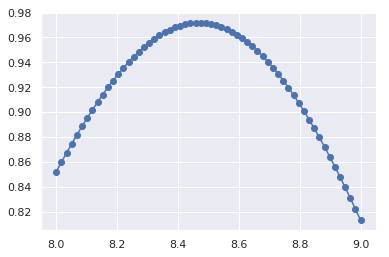

In [397]:
num_spins = 50
lmg_Hfree = lmg_model.LMG_free_term(num_spins=num_spins)
lmg_Htarget = lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=2)
psi_initial = ground_state(lmg_Hfree)
psi_target = ground_state(lmg_Htarget)
t1 = 5.2
tf_list = np.linspace(8, 9, 60)
fids = []
bar = progressbar.ProgressBar()
for tf in bar(tf_list):
    result = qutip.mesolve(H=lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=1.1),
                           rho0=psi_initial, tlist=np.linspace(0, t1, 40))
    result = qutip.mesolve(H=lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=1.5),
                           rho0=result.states[-1], tlist=np.linspace(0, tf - t1, 40))
    fids.append(qutip.fidelity(result.states[-1], psi_target)**2)
plt.figure(); plt.plot(tf_list, fids, '-o')
# fids

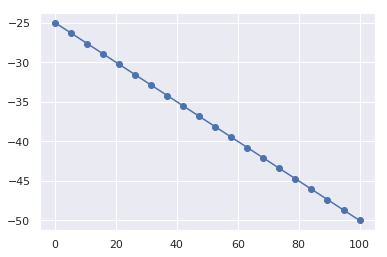

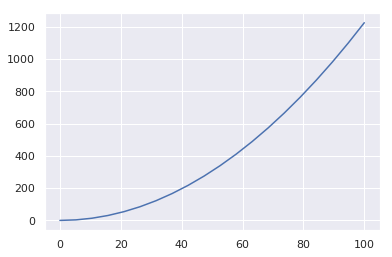

In [251]:
num_spins = 50
g_list = np.linspace(0, 100, 20)
exp_list = []
vars_list = []
for g in g_list:
    Hup = lmg_model.LMG_free_term(num_spins) + lmg_model.LMG_interaction_term(num_spins, g_value=g)
    psi0 = ground_state(lmg_model.LMG_free_term(num_spins))
    exp_list.append(qutip.expect(Hup, psi0))
    vars_list.append(qutip.variance(Hup, psi0))
plt.figure(); plt.plot(g_list, exp_list, '-o')
# plt.figure(); plt.plot(np.log10(g_list), np.log10(vars_list), '-o')
plt.figure(); plt.plot(g_list, vars_list, '-')

# **Rabi**: critical point crossing

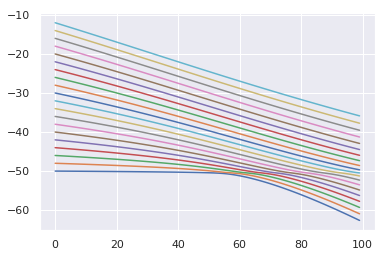

In [577]:
num_spins = 100
g_list = np.linspace(0, 2, 100)
num_eigenvalues = 20
spectrum = np.zeros(shape=(len(g_list), num_eigenvalues))
for idx, g in enumerate(g_list):
    eigvals = lmg_model.LMG_full_hamiltonian(num_spins=num_spins, g_value=g).eigenstates(eigvals=num_eigenvalues)[0]
    spectrum[idx] = eigvals
plt.figure()
plt.plot(spectrum);

In [202]:
filename = './results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/rabi_doublebang_powell_Omega100_bound20_tf20.csv'
df = pd.read_csv(filename, index_col=0)
df[df['fid'] > 0.5]

In [207]:
Hrabi = rabi_model.RabiModel(N=100, Omega=100, omega_0=1)
eig1, eig2 = Hrabi.hamiltonian(Hrabi.critical_value).eigenenergies(eigvals=2)
np.pi / (eig2 - eig1)

6.019322200965969

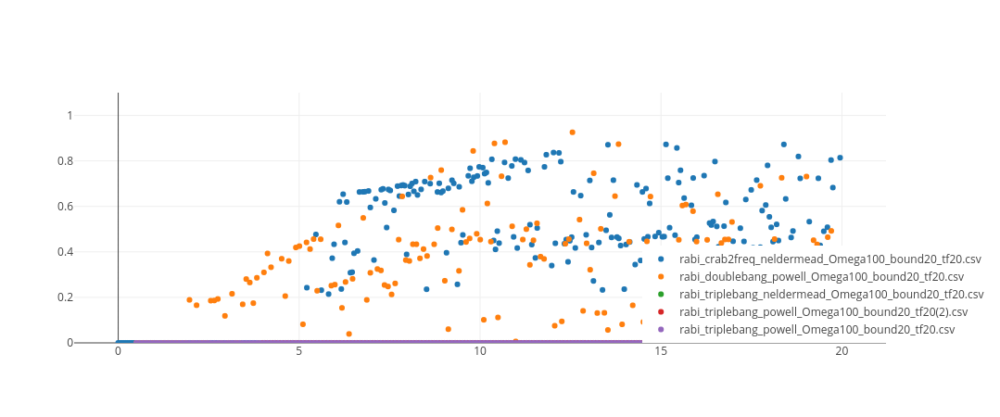

In [204]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_crossingcriticalphase_20190305/rabi*.csv
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0), yaxis=dict(range=[0, 1.1]))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

# Optimisations (Rabi and LMG) with triplebang

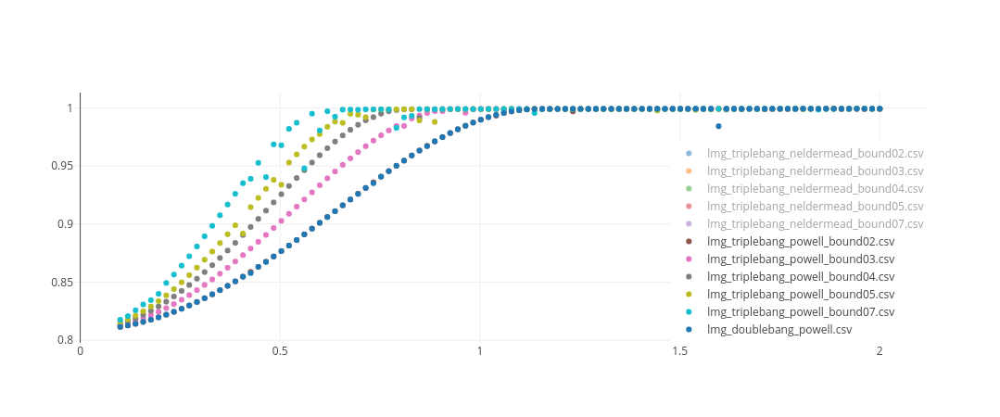

In [22]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_triplebamg_20190305/lmg*csv
    additional_50spins_file = './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv'
    datafiles += [additional_50spins_file]
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=df['fid'],
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

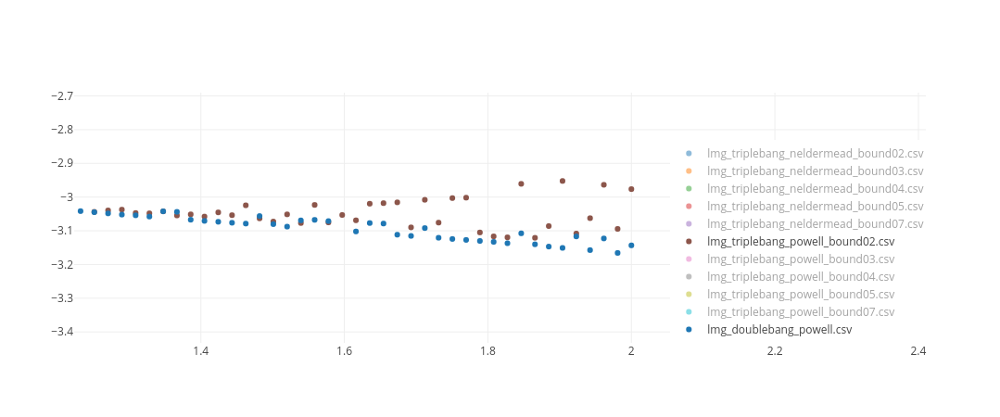

In [58]:
def _():
    # load data
    datafiles = !ls ./results/rabi_and_lmg_optimizations_triplebamg_20190305/lmg*csv
    additional_50spins_file = './results/rabi_and_lmg_optimizations_20190228/lmg_doublebang_powell.csv'
    datafiles += [additional_50spins_file]
    traces = []
    for file in datafiles:
        df = pd.read_csv(file, index_col=0)
        # plot
        traces.append(go.Scatter(
            x=df['tf'], y=np.log10(1 - df['fid']),
            mode='markers', name=os.path.split(file)[-1]
        ))
    layout = go.Layout(legend=dict(x=.7, y=0))
    plotly.offline.iplot(go.Figure(data=traces, layout=layout))
_()

# **LMG**: doublebang scans

In [53]:
lmg = lmg_model.LMGModel(num_spins=50)
initial_state = ground_state(lmg.H0)
target_state = ground_state(lmg.hamiltonian(g_value=1.))
tf_list = np.linspace(0, 2, 100)
time_ratios_list = np.linspace(0, 1, 100)
bound = [-2, 2]

results = np.zeros(shape=(len(tf_list) * len(time_ratios_list), 3))
bar = progressbar.ProgressBar()
idx = 0
for tf in bar(list(enumerate(tf_list))):
    for ratio in enumerate(time_ratios_list):
        protocol = protocols.DoubleBangProtocolAnsatz()
        protocol.fill_hyperpar_value(tf=tf)
        fun = protocol.time_dependent_fun(np.asarray([bound[1], ratio * tf, bound[0]]))
        output_state = optimization.evolve_state([lmg.H0, [lmg.H1, fun]], initial_state, tf)
        results[idx] = [tf, ratio, qutip.fidelity(output_state, target_state)**2]
        idx += 1
results = pd.DataFrame(results, columns=['tf', 'ratio', 'fid'])

100% (100 of 100) |######################| Elapsed Time: 0:07:38 Time:  0:07:38


# **LMG**: doublebang, optimal time VS number of spins

The question is here: how does the minimal time at which we can get a solution scale with the number of spins?

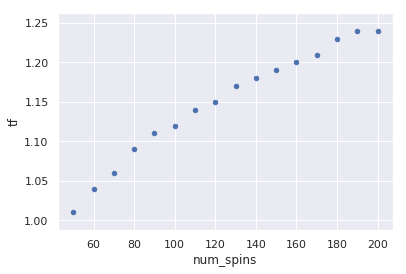

In [32]:
df = pd.read_csv('./results/lmg_timeVSnumspins_analysis/goodTime_vs_numSpins.csv', index_col=0)
df.plot(x='num_spins', y='tf', kind='scatter');

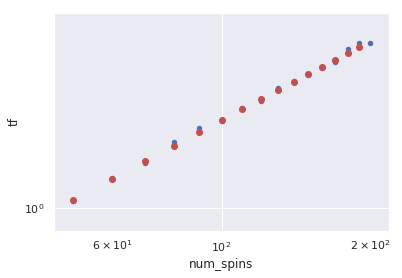

In [153]:
fig, ax = plt.subplots(1, 1)
df.plot(x='num_spins', y='tf', kind='scatter', loglog=True, ax=ax)

xs = np.arange(50, 200, 10)
ys = [np.exp(-0.5718) * x**(0.149) for x in xs]
ax.plot(xs, ys, 'ro')

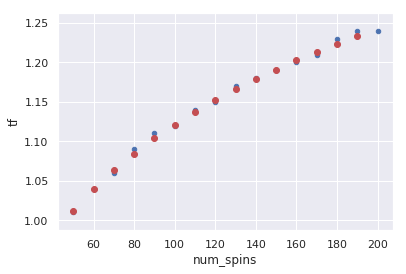

In [154]:
fig, ax = plt.subplots(1, 1)
df.plot(x='num_spins', y='tf', kind='scatter', ax=ax)

xs = np.arange(50, 200, 10)
ys = [np.exp(-0.5718) * x**(0.149) for x in xs]
ax.plot(xs, ys, 'ro')

In [174]:
np.polyfit(x=np.log(df['num_spins']), y=np.log(df['tf']), deg=1, cov=True)

(array([ 0.14918635, -0.57182845]), array([[ 4.64963968e-06, -2.20854758e-05],
        [-2.20854758e-05,  1.05695945e-04]]))

In [47]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'nelder-mead'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xatol=1e-12, fatol=1e-12, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xatol': 1e-12, 'ftol': 1e-12, 'disp': True}


/adsusers/40168729/miniconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:468: DeprecationWarning:

ftol is deprecated for Nelder-Mead, use fatol instead. If you specified both, only fatol is used.



Optimization terminated successfully.
         Current function value: 0.000462
         Iterations: 180
         Function evaluations: 416


fid    0.999076
tf     1.200000
y0     1.863475
t1     0.887786
y1    -1.698627
Name: 0, dtype: float64

In [72]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 2
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-08, 'ftol': 1e-08, 'disp': True}
Optimization terminated successfully.
         Current function value: -0.000000
         Iterations: 5
         Function evaluations: 560


fid    1.000000
tf     1.200000
y0     0.584210
t1     1.112354
y1    -1.665693
Name: 0, dtype: float64

In [73]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 4
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-16, 'ftol': 1e-16, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 5
         Function evaluations: 768


fid    0.999977
tf     1.200000
y0     1.379682
t1     0.399974
y1     0.219908
Name: 0, dtype: float64

In [68]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 6
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-8, ftol=1e-8, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-08, 'ftol': 1e-08, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000051
         Iterations: 6
         Function evaluations: 566


fid    0.999898
tf     1.200000
y0     1.932540
t1     0.327545
y1     0.207660
Name: 0, dtype: float64

In [55]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 20
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.04]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-16, 'ftol': 1e-16, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000304
         Iterations: 9
         Function evaluations: 1279


fid    0.999392
tf     1.040000
y0     1.916530
t1     0.728282
y1    -1.711842
Name: 0, dtype: float64

In [48]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 20
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-8, ftol=1e-8, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-08, 'ftol': 1e-08, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000289
         Iterations: 10
         Function evaluations: 1132


fid    0.999421
tf     1.200000
y0     1.972599
t1     0.586571
y1    -0.272142
Name: 0, dtype: float64

In [34]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-8, ftol=1e-8, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000461
         Iterations: 9
         Function evaluations: 1023


fid    0.999078
tf     1.200000
y0     1.832510
t1     0.908536
y1    -1.874537
Name: 0, dtype: float64

In [37]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-12, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000463
         Iterations: 14
         Function evaluations: 2150


fid    0.999074
tf     1.200000
y0     1.876812
t1     0.877485
y1    -1.614593
Name: 0, dtype: float64

In [40]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.2]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-16, 'ftol': 1e-16, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000467
         Iterations: 13
         Function evaluations: 1987


fid    0.999066
tf     1.200000
y0     1.999999
t1     0.810439
y1    -1.210802
Name: 0, dtype: float64

In [41]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.3]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-16, 'ftol': 1e-16, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000443
         Iterations: 8
         Function evaluations: 1144


fid    0.999114
tf     1.300000
y0     1.560724
t1     1.035321
y1    -1.815538
Name: 0, dtype: float64

In [42]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.4]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-16, 'ftol': 1e-16, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000448
         Iterations: 11
         Function evaluations: 1563


fid    0.999103
tf     1.400000
y0     1.976843
t1     0.681373
y1    -0.077010
Name: 0, dtype: float64

In [43]:
model = 'lmg'
protocol = 'doublebang'
optimization_method = 'Powell'
num_spins = 50
# ------ start optimization
results = optimization.find_best_protocol(
    problem_specification=dict(
        model=model,
        model_parameters=dict(num_spins=num_spins),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol,
        optimization_method=optimization_method,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
    ),
    other_options=dict(
        scan_times=[1.5]
        # stopping_condition=0.999
    )
)
results.iloc[-1]

{'xtol': 1e-16, 'ftol': 1e-16, 'disp': True}
Optimization terminated successfully.
         Current function value: 0.000411
         Iterations: 8
         Function evaluations: 1128


fid    0.999178
tf     1.500000
y0     1.206485
t1     1.304836
y1    -1.980989
Name: 0, dtype: float64

## Can we get arbitrarily low infidelities with just $4$ spins in the LMG?? (spoilers: no)

In [83]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol_ansatz.DoubleBangProtocolAnsatz(),
        optimization_method='Powell',
#         initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True),
        parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[0.8])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 7
         Function evaluations: 1079


fid    0.999959
tf     0.800000
y0     4.544673
t1     0.179196
y1    -0.416735
Name: 0, dtype: float64

In [82]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol_ansatz.DoubleBangProtocolAnsatz(),
        optimization_method='Powell',
#         initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True),
        parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 6
         Function evaluations: 871


fid    0.999976
tf     1.000000
y0     0.971977
t1     0.917565
y1    -4.999749
Name: 0, dtype: float64

In [84]:
third_time = lambda t: t / 3.
twothirds_time = lambda t: 2 * t / 3.
initial_parameters = [[-1, 1]] * 3 + [third_time, twothirds_time]
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol_ansatz.TripleBangProtocolAnsatz(),
        optimization_method='Powell',
        initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True),
        parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 7
         Function evaluations: 1698


fid    0.999973
tf     1.000000
y1     1.433828
y2     1.001153
y3    -0.725539
t1     0.232226
t2     0.684414
Name: 0, dtype: float64

In [86]:
time_over_four = lambda t: t / 4.
time_two_over_four = lambda t: 2 / 4.
time_three_over_four = lambda t: 3 / 4.
initial_parameters = [[-1, 1]] * 4 + [time_over_four, time_two_over_four, time_three_over_four]
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol_ansatz.QuadrupleBangProtocolAnsatz(),
        optimization_method='Powell',
        initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True),
        parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 4
         Function evaluations: 1291


fid    0.999964
tf     1.000000
y1     2.562333
y2    -0.484160
y3    -0.463618
y4     0.613857
t1     0.309451
t2     0.348487
t3     0.801599
Name: 0, dtype: float64

In [119]:
time_over_four = lambda t: t / 4.
time_two_over_four = lambda t: 2 / 4.
time_three_over_four = lambda t: 3 / 4.
initial_parameters = [[-1, 1]] * 4 + [time_over_four, time_two_over_four, time_three_over_four]
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol=protocol_ansatz.QuadrupleBangProtocolAnsatz(),
        optimization_method='Powell',
        initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True),
        parameters_constraints=[-20, 20]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 4
         Function evaluations: 1309


fid    0.999972
tf     1.000000
y1     2.231377
y2     1.036721
y3    -0.260069
y4    -0.243351
t1     0.136134
t2     0.536653
t3     0.613723
Name: 0, dtype: float64

In [88]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol='crab', protocol_options=dict(num_frequencies=3),
        optimization_method='Powell',
#         initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
#         parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.007485
         Iterations: 7
         Function evaluations: 2350


fid       0.985086
tf        1.000000
y0        0.000000
y1        1.000000
nuk1     -0.347738
nuk2      0.199653
nuk3      0.269551
A1      -25.413423
A2       85.766276
A3       12.996856
B1      -44.421088
B2      154.595575
B3     -125.202880
Name: 0, dtype: float64

In [100]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol='crab', protocol_options=dict(num_frequencies=10),
        optimization_method='Powell',
#         initial_parameters=initial_parameters,
        optimization_options=dict(disp=True)
#         parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

Optimization terminated successfully.
         Current function value: 0.000558
         Iterations: 12
         Function evaluations: 7563


fid        0.998885
tf         1.000000
y0         0.000000
y1         1.000000
nuk1      -0.140255
nuk2       0.168008
nuk3      -0.233384
nuk4       0.220020
nuk5      -0.226271
nuk6      -0.297111
nuk7      -0.427202
nuk8       0.490943
nuk9       0.357580
nuk10      0.283495
A1      -199.999852
A2        -5.644388
A3         0.113375
A4        -8.139368
A5        24.987960
A6       -11.491274
A7        -4.936212
A8        12.446776
A9        -0.339011
A10        2.166167
B1        34.382485
B2        -9.771841
B3        65.930036
B4       -13.526108
B5       -16.165196
B6        47.413895
B7        -9.309213
B8       -17.772444
B9        11.694112
B10       -2.052922
Name: 0, dtype: float64

In [101]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol='crab', protocol_options=dict(num_frequencies=10),
        optimization_method='Nelder-Mead',
#         initial_parameters=initial_parameters,
        optimization_options=dict(disp=True)
#         parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

fid        0.991810
tf         1.000000
y0         0.000000
y1         1.000000
nuk1      -0.070384
nuk2       0.143582
nuk3       0.478115
nuk4      -0.400699
nuk5       0.354001
nuk6       0.389821
nuk7      -0.241791
nuk8      -0.230499
nuk9       0.006594
nuk10      0.476345
A1      -129.902286
A2        -7.876602
A3       -63.953811
A4         3.032918
A5        12.430613
A6        10.743273
A7        -3.412264
A8        40.475209
A9        -3.370995
A10       -1.405392
B1        23.277281
B2        23.859016
B3        11.938326
B4        -6.851028
B5         9.426206
B6        -1.317618
B7        -5.558699
B8        13.926483
B9         6.654994
B10       62.162510
Name: 0, dtype: float64

In [ ]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol='crab', protocol_options=dict(num_frequencies=20),
        optimization_method='Nelder-Mead',
#         initial_parameters=initial_parameters,
        optimization_options=dict(disp=True)
#         parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]

In [ ]:
results = optimization.find_best_protocol(
    problem_specification=dict(
        model='lmg',
        model_parameters=dict(num_spins=4),
        task='critical point'
    ),
    optimization_specs=dict(
        protocol='crab', protocol_options=dict(num_frequencies=4),
        optimization_method='Powell',
#         initial_parameters=initial_parameters,
        optimization_options=dict(xtol=1e-16, ftol=1e-16, disp=True)
#         parameters_constraints=[-5, 5]
    ),
    other_options=dict(scan_times=[1])
)
results.iloc[-1]